# SALSA multicore lake sediment analysis

M. Siegfried (siegfried@mines.edu)\
Ryan Venturelli (rventurelli@tulane.edu)\
Will Arnuk (warnuk1@binghamton.edu)\
Molly Patterson (patterso@binghamton.edu)

In [1]:
# import all the packages we'll use in the notebook
from pydicom import dcmread
import matplotlib.pyplot as plt
import pyvista as pv
pv.set_jupyter_backend("panel")

from ipywidgets import interactive
import ipywidgets as widgets
                 
import pandas as pd
import numpy as np
from glob import glob
import time
import random
import skimage.segmentation as seg

# Initial load

We have all the individual CT images stored in `data/01UW-C` as dicom files. Loop through them, load them, and then sort them by the slice location to make sure they are listed in our list (`slices`) of 2D numpy arrays (`ds`) correctly

In [2]:
# get the list of files for the core
files = glob('data/01UW-C/IM*')

# skip files with no SliceLocation information (should be a float)
slices = []
skipcount = 0
for f in files:
    ds = dcmread(f)
    if isinstance(ds.SliceLocation,float):
        slices.append(ds)
    else:
        skipcount = skipcount + 1

print("skipped, no SliceLocation: {}".format(skipcount))
print("loaded: {}".format(len(slices)))
# re-sort to put the slices in the right order
slices = sorted(slices, key=lambda s: s.SliceLocation)

skipped, no SliceLocation: 0
loaded: 34


# Initial processing

Now that they are loaded, we need to build the 3D numpy array (`img3d`), then toss out the bits of the images that are just CT background

After we do that, we are left with our 3D numpy array `core` that forms the basis of everything we will do. The first thing will be to run a quick unsupervised classification to isolate lake sediments at the top of the column

In [3]:
# pixel dimensions, assuming all slices are the same
ps = slices[0].PixelSpacing
ss = slices[0].SliceThickness

# create 3D array
img_shape = list(slices[0].pixel_array.shape)
img_shape.append(len(slices))
img3d = np.zeros(img_shape)

# fill 3D array with the images from the files
for i, s in enumerate(slices):
    img2d = s.pixel_array
    img3d[:, :, i] = img2d
    
# Subset to get rid of most of the background -- indices determined by hand
core = np.copy(img3d[70:1500,670:871,:])

# get the shape of the images and make vectors for x (columns), y (rows), and z (slices).
shp = core.shape
yvals = np.arange(0,shp[0])*ps[0]
xvals = np.arange(0,shp[1])*ps[1]-np.mean(np.arange(0,shp[1])*ps[1])
zvals = np.arange(0,shp[2])*ss-np.mean(np.arange(0,shp[2])*ss)

# go through and do a quick unsupervised classification of the core that
# we will use as a mask to only look at laminated lake sediments
core_mask = np.empty(core.shape)
for i in np.arange(0,shp[2]):
    thisslice = core[:,:,i]
    mskd = seg.slic(thisslice, n_segments=3, start_label=0)
    core_mask[:,:,i] = mskd

# load traced tops of undeformed core -- these are indices relative to 70 mm
coretops = pd.read_csv('data/core_tops.csv')

# only use indices from -2 cm to +2.5 cm in x (edges are deformed)
minx = -20 # in mm
maxx = 25 # in mm
ix = np.where(np.logical_and(xvals>=minx, xvals<=maxx))[0]
xvals_subset = xvals[ix]


# Looking at the core

First we are just going to look at the core images. This first cell will generate a widget that allows you to loop through all the CT slices and see what we're working with

In [4]:
#### Flip through all the core images as a widget. Throw out the useless ones

# only use incides from slices at -27 mm to 29 mm
min_slice = -27 # in mm
max_slice = 29 # in mm
iz = np.where(np.logical_and(zvals>=min_slice, zvals<=max_slice))[0]

# need a consistent area of laminated lake seds to find the right mask value; arbitrarily determined
miny_laminated = 100 # in mm
maxy_laminated = 120 # in mm
iy_laminated = np.where(np.logical_and(yvals>=miny_laminated, yvals<=maxy_laminated))[0]

def f(slice_val):
    i = np.where(zvals==slice_val)[0]
    msk = core_mask[:,:,i]
    thisslice = np.copy(core[:,:,i])
    msk_val = np.round(msk[iy_laminated,:][:,ix].mean())
    thisslice[msk!=msk_val] = np.nan
    thisslice[thisslice<0] = np.nan
    fig = plt.figure(figsize=(4,16))
    im2 = plt.imshow(thisslice, cmap='plasma', extent=[min(xvals), max(xvals), max(yvals), min(yvals)])
    im1 = plt.imshow(core[:,:,i], cmap='plasma', extent=[min(xvals), max(xvals), max(yvals), min(yvals)], alpha=0.1)
    plt.title("slice location: " + str(slice_val) + " mm")
    im1.set_clim(0,1000)
    im2.set_clim(0,1000)
    plt.xlabel('CT x location [mm]')
    plt.ylabel('CT y location [mm]')
    plt.show()
img = interactive(f, slice_val=widgets.IntSlider(min = min_slice, max = max_slice, step = ss, value=1));
display(img)

interactive(children=(IntSlider(value=1, description='slice_val', max=29, min=-27, step=2), Output()), _dom_cl…

# Just for fun: diamict clasts!

_Note: you have to be using JupyterLab to make this work (I think)_

This is just an example of where we could go with this notebook one day. Here we use Bane Sullivan's wonderful PyVista wrapper for VTK to image the core in 3D and make a color scale/opacity combination that let's us see the clasts in the diamict super well. 

You can rotate this around with your mouse, zoom in with your mouse scroll wheel, pan by holding shift while you click and drag. Have fun 

In [5]:

volume = pv.wrap(core)
volume.spacing = [ps[0], ps[1], ss]
opacity = [0, 0, 0, 0.1, 0.3, 0.6, 1]# with clims -500 to 4000 for clasts
pl = pv.Plotter()
pl.add_volume(volume, opacity=opacity, clim = (-500,4000), 
                   cmap='plasma', show_scalar_bar=False)
pl.show()

# Processing to brightness values

Okay we've had enough fun. Let's process to brightness values now. 

There are two cells to do this:

(1) Mask to only lake sediments. This NaN-pads the top of the region until it reaches the top of the lake sediments (which were hand traced horizons). This cell also plots each slice  with non-lake sediments transparent and lake sediments full opacity as a sanity check to make sure everything worked right

(2) With all the images appropriately masked, we concatonated all the traces into an individual pandas dataframe, then filter it to remove clasts (identified with a brightness threshold determined by looking at a histogram) and remove voids (identified as negative brightness values). We set the threshold to throw out a trace at 2% for each. We then plot all the traces side-by-side, the traces filtered for clasts, the traces filtered for voids, and the traces filtered for voids and clasts to make sure everything looks right.

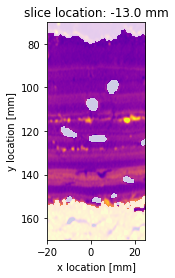

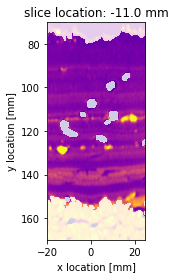

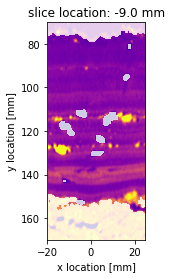

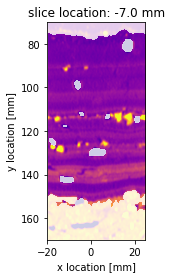

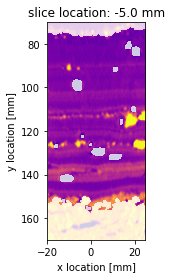

In [6]:
# sample core vertical for pixel brightness values
# limit to certain slices and certain location in the core to avoid deformed bits

# only use incides from slices at -11.0 mm to 3.0 mm determined as the
# undeformed slices by eye. 
min_slice = -13 # in mm
max_slice = -5 # in mm
iz = np.where(np.logical_and(zvals>=min_slice, zvals<=max_slice))[0]

# grab depth indices that we will extract
miny = 70 # in mm
maxy = 170 # in mm
iy = np.where(np.logical_and(yvals>=miny, yvals<=maxy))[0]
yvals_subset = yvals[iy]

traces_out = np.empty((len(yvals_subset),len(xvals_subset)*len(iz)))

# extract each slice of undeformed laminated sediments
for cnt,i in enumerate(iz):
    thisslice = np.copy(core[:,:,i])
    seds_nomsk = np.copy(thisslice)
    thistop = coretops.iloc[:,[cnt]]

    # mask the core slice
    msk = core_mask[:,:,i]
    msk_val = np.round(msk[iy_laminated,:][:,ix].mean())
    thisslice[msk!=msk_val] = np.nan
    thisslice[thisslice<0] = np.nan
    
    # subset to the lake sediments
    seds = thisslice[iy,:][:,ix]
    seds_nomsk = seds_nomsk[iy,:][:,ix]
    
    # go through each vertical trace and fill nans to the core top
    for j in np.arange(0,len(seds[0,:])):
        seds[0:int(thistop.iloc[j]),j] = np.nan
    
    traces_out[:,cnt*len(xvals_subset):(cnt+1)*len(xvals_subset)] = seds
    # plot the lake seds with the masked bits light and the good data heavy
    fig = plt.figure(figsize=(4,4))
    im2 = plt.imshow(seds, cmap='plasma', extent = [min(xvals[ix]), max(xvals[ix]), max(yvals_subset), min(yvals_subset)])
    im1 = plt.imshow(seds_nomsk, cmap='plasma', 
                     extent = [min(xvals[ix]), max(xvals[ix]), max(yvals[iy]), min(yvals[iy])],
                     alpha = 0.2)
    #plt.plot(xvals[ix], yvals_subset[thistop], 'k')
    im1.set_clim(0,1000)
    im2.set_clim(0,1000)
    plt.title("slice location: " + str(zvals[i]) + " mm")
    plt.xlim((-20,25))
    plt.xlabel('x location [mm]')
    plt.ylabel('y location [mm]')
    plt.show()



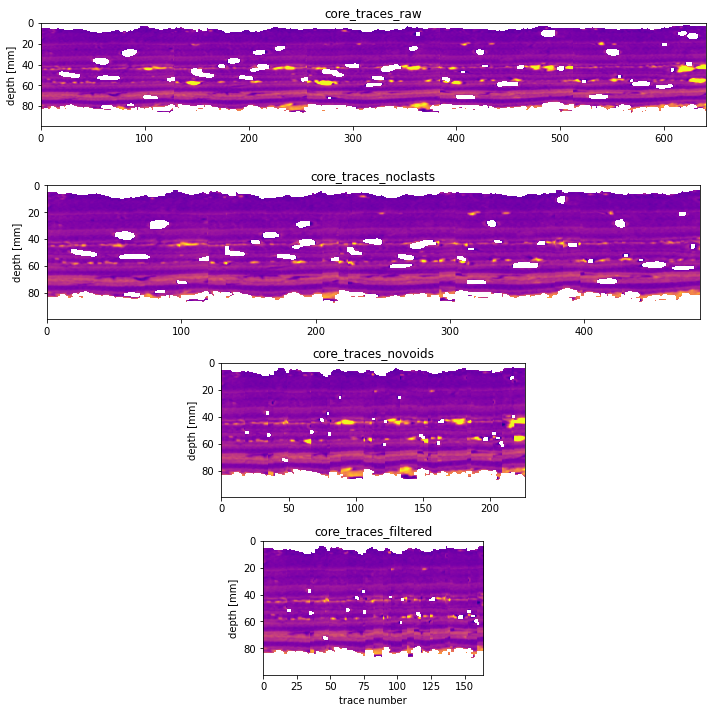

In [7]:
thresh = 800 # brightness threshold for saying something is a clast
filt_limit = 0.02 # if a trace has more than this fraction of "bad" data, throw it out

# calculate number of values between top and bottom of lake sediments
shp = traces_out.shape
num_values=np.empty(shp[1])

# find the last NaN on top and the first NaN on bottom, then calculate the number of indices in-between
for i in np.arange(0,shp[1]):
    thistrace = traces_out[:,i]
    idx_start = np.argmin(np.isnan(thistrace))
    idx_end = len(thistrace)-np.argmin(np.isnan(np.flip(thistrace)))
    num_values[i] = idx_end - idx_start
    
# use our clast brightness threshold to filter
clasts=traces_out>thresh
no_clasts = np.sum(clasts,axis=0)/num_values < filt_limit

# we already replaced all negative brightness with nan, so now we just count them up
no_voids = np.sum(~np.isnan(traces_out), axis=0)/num_values > 1 - filt_limit

fig, (ax1,ax2,ax3,ax4) = plt.subplots(4,1, figsize=(10,10))
ax1.imshow(traces_out, clim=(0,1000), cmap='plasma', 
           extent=[0,len(traces_out[0,:]),max(yvals_subset)-yvals_subset[0],min(yvals_subset)-yvals_subset[0]])
ax1.set_title('core_traces_raw')
ax1.set_ylabel('depth [mm]')


ax2.imshow(traces_out[:,no_clasts], clim=(0,1000), cmap='plasma', 
           extent=[0,len(traces_out[0,no_clasts]),max(yvals_subset)-yvals_subset[0],min(yvals_subset)-yvals_subset[0]])
ax2.set_title('core_traces_noclasts')
ax2.set_ylabel('depth [mm]')

ax3.imshow(traces_out[:,no_voids], clim=(0,1000), cmap='plasma', 
           extent=[0,len(traces_out[0,no_voids]),max(yvals_subset)-yvals_subset[0],min(yvals_subset)-yvals_subset[0]])
ax3.set_title('core_traces_novoids')
ax3.set_ylabel('depth [mm]')

ax4.imshow(traces_out[:,np.logical_and(no_clasts,no_voids)], clim=(0,1000), cmap='plasma', 
           extent=[0,len(traces_out[0,np.logical_and(no_clasts,no_voids)]),max(yvals_subset)-yvals_subset[0],min(yvals_subset)-yvals_subset[0]])
ax4.set_title('core_traces_filtered')
ax4.set_xlabel('trace number')
ax4.set_ylabel('depth [mm]')

fig.tight_layout()
plt.show()

In [8]:
# Cell for saving all the data to send to Molly!
"""
df_all = pd.DataFrame(traces_out)
df_all = df_all.set_index(yvals_subset-yvals_subset[0])
df_all.to_csv('core_traces_raw.csv', header = False, na_rep='nan')

df_noclasts = pd.DataFrame(traces_out[:,no_clasts])
df_noclasts = df_noclasts.set_index(yvals_subset-yvals_subset[0])
df_noclasts.to_csv('core_traces_noclasts.csv', header = False, na_rep='nan')

df_novoids = pd.DataFrame(traces_out[:,no_voids])
df_novoids = df_novoids.set_index(yvals_subset-yvals_subset[0])
df_novoids.to_csv('core_traces_novoids.csv', header = False, na_rep='nan')

df_filtered = pd.DataFrame(traces_out[:,np.logical_and(no_clasts,no_voids)])
df_filtered = df_filtered.set_index(yvals_subset-yvals_subset[0])
df_filtered.to_csv('core_traces_filtered.csv', header = False, na_rep='nan')
"""

"\ndf_all = pd.DataFrame(traces_out)\ndf_all = df_all.set_index(yvals_subset-yvals_subset[0])\ndf_all.to_csv('core_traces_raw.csv', header = False, na_rep='nan')\n\ndf_noclasts = pd.DataFrame(traces_out[:,no_clasts])\ndf_noclasts = df_noclasts.set_index(yvals_subset-yvals_subset[0])\ndf_noclasts.to_csv('core_traces_noclasts.csv', header = False, na_rep='nan')\n\ndf_novoids = pd.DataFrame(traces_out[:,no_voids])\ndf_novoids = df_novoids.set_index(yvals_subset-yvals_subset[0])\ndf_novoids.to_csv('core_traces_novoids.csv', header = False, na_rep='nan')\n\ndf_filtered = pd.DataFrame(traces_out[:,np.logical_and(no_clasts,no_voids)])\ndf_filtered = df_filtered.set_index(yvals_subset-yvals_subset[0])\ndf_filtered.to_csv('core_traces_filtered.csv', header = False, na_rep='nan')\n"